In [1]:
import numpy as np
import pandas as pd

import requests
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
sd = pd.read_csv("limpios/salarios_detail_por_jugador.csv")
sd

,temporada,liga,nombre_jugador,equipo,prestamo,es_titular,firma_contrato,vencimiento_contrato,posicion,edad,pais_jugador,bruto_anual,neto_anual,bono_bruto,bono_neto,total_bruto,total_neto,clausula_rescision,pais
0,2023,Serie A,Éderson,Atalanta,False,True,2022-07-06,2026-06-30,Centrocampista,24,Brazil,2560000.0,2000000.0,NaN,NaN,7680000.0,6000000.0,NaN,Italy
1,2023,La Liga,Pepelu,Valencia,False,True,2023-07-08,2028-06-30,Centrocampista,25,Spain,1300000.0,620000.0,NaN,NaN,6500000.0,3100000.0,1.000000e+08,Spain
2,2023,La Liga,Pep Chavarría,Rayo Vallecano,False,False,2022-08-31,2027-06-30,Defensa,25,Spain,350000.0,170000.0,NaN,NaN,1400000.0,680000.0,NaN,Spain
3,2023,La Liga,Pejiño,Las Palmas,False,False,2023-06-22,2026-06-30,Delantero,27,Spain,720000.0,350000.0,NaN,NaN,2160000.0,1050000.0,NaN,Spain
4,2023,La Liga,Pedri,Barcelona,False,False,2021-10-14,2026-06-30,Centrocampista,20,Spain,9380000.0,4500000.0,NaN,NaN,28140000.0,13500000.0,1.000000e+09,Spain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8614,2021,Premier League,Jack Stephens,Southampton,NaN,NaN,NaN,NaN,Defensa,28,England,2691421.0,1483732.0,NaN,NaN,NaN,NaN,NaN,England
8615,2021,Premier League,Jack Harrison,Leeds,NaN,NaN,NaN,NaN,Delantero,25,England,2990467.0,1644757.0,NaN,NaN,NaN,NaN,NaN,England
8616,2021,Premier League,Jack Grealish,Manchester City,NaN,NaN,NaN,NaN,Delantero,26,England,17942805.0,9868543.0,NaN,NaN,NaN,NaN,NaN,England
8617,2021,Premier League,Jack Cork,Burnley,NaN,NaN,NaN,NaN,Centrocampista,32,England,2277356.0,1253696.0,NaN,NaN,NaN,NaN,NaN,England


In [3]:
sd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8619 entries, 0 to 8618
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   temporada             8619 non-null   int64  
 1   liga                  8619 non-null   object 
 2   nombre_jugador        8619 non-null   object 
 3   equipo                8619 non-null   object 
 4   prestamo              2640 non-null   object 
 5   es_titular            2640 non-null   object 
 6   firma_contrato        2635 non-null   object 
 7   vencimiento_contrato  2640 non-null   object 
 8   posicion              8619 non-null   object 
 9   edad                  8619 non-null   int64  
 10  pais_jugador          8619 non-null   object 
 11  bruto_anual           8584 non-null   float64
 12  neto_anual            8584 non-null   float64
 13  bono_bruto            103 non-null    float64
 14  bono_neto             103 non-null    float64
 15  total_bruto          

In [4]:
sd = sd[sd.bruto_anual.notnull()]

In [5]:
sd = sd[sd.bruto_anual != 0]

In [6]:
sd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8497 entries, 0 to 8618
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   temporada             8497 non-null   int64  
 1   liga                  8497 non-null   object 
 2   nombre_jugador        8497 non-null   object 
 3   equipo                8497 non-null   object 
 4   prestamo              2605 non-null   object 
 5   es_titular            2605 non-null   object 
 6   firma_contrato        2600 non-null   object 
 7   vencimiento_contrato  2605 non-null   object 
 8   posicion              8497 non-null   object 
 9   edad                  8497 non-null   int64  
 10  pais_jugador          8497 non-null   object 
 11  bruto_anual           8497 non-null   float64
 12  neto_anual            8497 non-null   float64
 13  bono_bruto            103 non-null    float64
 14  bono_neto             103 non-null    float64
 15  total_bruto          

In [7]:
sd.groupby(["temporada", "liga", "equipo"]).bruto_anual.describe()

count          mean           std  \
temporada liga       equipo                                                 
2021      Bundesliga Arminia Bielefeld   27.0  3.937037e+05  4.028948e+05   
                     Augsburg            29.0  8.762069e+05  5.040012e+05   
                     Bayer Leverkusen    31.0  1.837097e+06  1.399974e+06   
                     Bayern Munich       28.0  8.436071e+06  7.817937e+06   
                     Bochum              32.0  4.928125e+05  3.132888e+05   
...                                       ...           ...           ...   
2023      Serie A    Salernitana         27.0  1.058889e+06  9.968733e+05   
                     Sassuolo            27.0  1.248148e+06  1.206052e+06   
                     Torino              26.0  1.491923e+06  1.037462e+06   
                     Udinese             36.0  7.288889e+05  5.328885e+05   
                     Verona              33.0  7.175758e+05  5.214105e+05   

                                             min        25%        50%  \
temporada liga       equipo                                              
2021      Bundesliga Arminia Bielefeld   50000.0   190000.0   280000.0   
                     Augsburg            20000.0   540000.0   840000.0   
                     Bayer Leverkusen    60000.0   915000.0  1600000.0   
                     Bayern Munich      100000.0  1800000.0  6000000.0   
                     Bochum              20000.0   277500.0   440000.0   
...                                          ...        ...        ...   
2023      Serie A    Salernitana        120000.0   380000.0   640000.0   
                     Sassuolo           120000.0   580000.0  1090000.0   
                     Torino             140000.0   747500.0  1290000.0   
                     Udinese            120000.0   280000.0   575000.0   
                     Verona             120000.0   380000.0   500000.0   

                                               75%         max  
temporada liga       equipo                                     
2021      Bundesliga Arminia Bielefeld    405000.0   1820000.0  
                     Augsburg            1000000.0   2100000.0  
                     Bayer Leverkusen    2615000.0   6000000.0  
                     Bayern Munich      15500000.0  23000000.0  
                     Bochum               732500.0   1300000.0  
...                                            ...         ...  
2023      Serie A    Salernitana         1390000.0   4630000.0  
                     Sassuolo            1540000.0   5560000.0  
                     Torino              1902500.0   4630000.0  
                     Udinese             1030000.0   2310000.0  
                     Verona               930000.0   2220000.0  

[292 rows x 8 columns]

In [8]:
sd.groupby(["liga", "temporada"]).bruto_anual.min()

liga            temporada
Bundesliga      2021          20000.0
                2022          20000.0
                2023         120000.0
La Liga         2021          40000.0
                2022          60000.0
                2023         120000.0
Ligue 1         2021          20000.0
                2022          20000.0
                2023         120000.0
Premier League  2021          23924.0
                2022         119619.0
                2023          89714.0
Serie A         2021          37000.0
                2022          26000.0
                2023          42000.0
Name: bruto_anual, dtype: float64

In [9]:
sd.groupby(["liga", "temporada"]).bruto_anual.describe()

count          mean           std       min  \
liga           temporada                                                
Bundesliga     2021       569.0  1.626960e+06  2.748955e+06   20000.0   
               2022       570.0  1.858544e+06  2.966591e+06   20000.0   
               2023       513.0  1.882359e+06  3.081944e+06  120000.0   
La Liga        2021       571.0  2.508091e+06  4.397066e+06   40000.0   
               2022       540.0  2.437037e+06  4.226744e+06   60000.0   
               2023       497.0  2.346338e+06  3.968223e+06  120000.0   
Ligue 1        2021       631.0  1.340634e+06  4.808123e+06   20000.0   
               2022       624.0  1.392644e+06  4.783240e+06   20000.0   
               2023       481.0  1.502869e+06  4.053398e+06  120000.0   
Premier League 2021       562.0  3.722393e+06  3.734065e+06   23924.0   
               2022       591.0  4.052042e+06  3.855566e+06  119619.0   
               2023       546.0  3.865383e+06  3.824491e+06   89714.0   
Serie A        2021       589.0  2.060526e+06  2.226334e+06   37000.0   
               2022       645.0  1.737659e+06  2.110282e+06   26000.0   
               2023       568.0  1.779651e+06  1.964315e+06   42000.0   

                                25%        50%        75%         max  
liga           temporada                                               
Bundesliga     2021        300000.0   780000.0  1800000.0  23000000.0  
               2022        372500.0   905000.0  2000000.0  22000000.0  
               2023        350000.0   840000.0  2000000.0  25000000.0  
La Liga        2021        445000.0  1000000.0  2270000.0  31250000.0  
               2022        435000.0   925000.0  2425000.0  37500000.0  
               2023        450000.0   960000.0  2290000.0  37500000.0  
Ligue 1        2021        130000.0   440000.0  1000000.0  72000000.0  
               2022        150000.0   480000.0  1080000.0  72000000.0  
               2023        250000.0   570000.0  1200000.0  72000000.0  
Premier League 2021       1380216.0  2691421.0  4784748.0  30801815.0  
               2022       1794280.0  2990467.0  5083795.0  30801815.0  
               2023       1495234.0  2691421.0  5083795.0  23923740.0  
Serie A        2021        640000.0  1300000.0  2590000.0  13520000.0  
               2022        450000.0  1030000.0  1920000.0  12960000.0  
               2023        460000.0  1110000.0  2410000.0  12960000.0

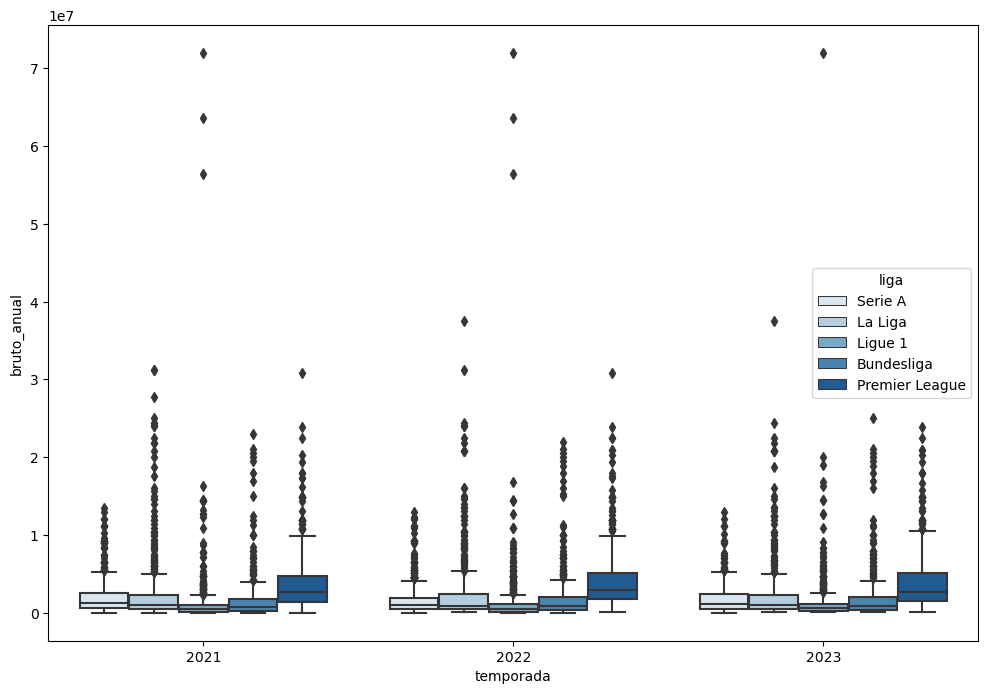

In [12]:
plt.subplots(figsize = (12, 8))

sns.boxplot(x = "temporada",
            y = "bruto_anual",
            hue = "liga",
            data = sd,
            palette = "Blues")
plt.show()

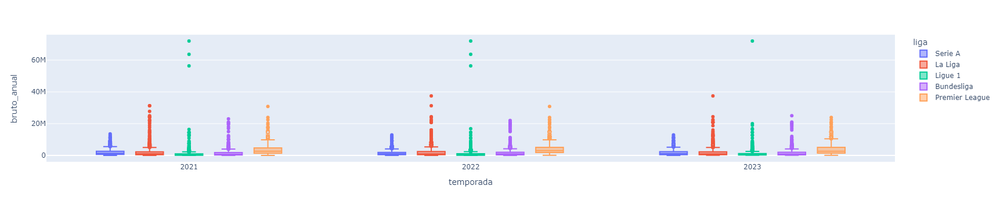

In [15]:
px.box(data_frame = sd,
       x          = "temporada",
       y          = "bruto_anual",
       color      = "liga",
       #facet_col  = "equipo",
       points     = "suspectedoutliers",
       hover_name = "nombre_jugador")
       #hover_data = sd.columns)

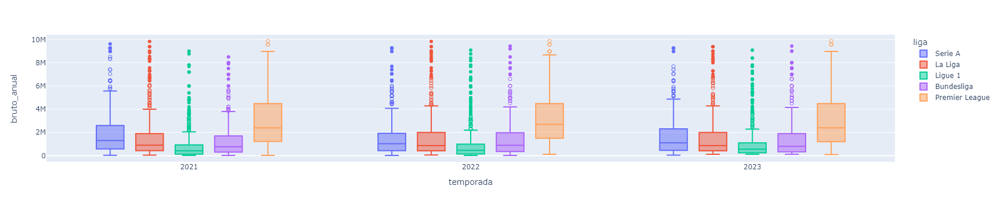

In [19]:
px.box(data_frame = sd[(sd["bruto_anual"] < 10000000)],
       x          = "temporada",
       y          = "bruto_anual",
       color      = "liga",
       #facet_col  = "equipo",
       points     = "suspectedoutliers",
       hover_name = "nombre_jugador")

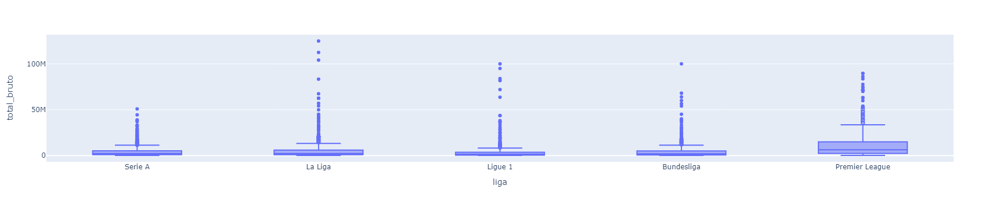

In [24]:
px.box(data_frame = sd[sd['temporada'] == 2023],
       x          = "liga",
       y          = "total_bruto",
       #color      = "liga",
       points     = "suspectedoutliers",
       hover_name = "nombre_jugador",
       hover_data = sd.columns)

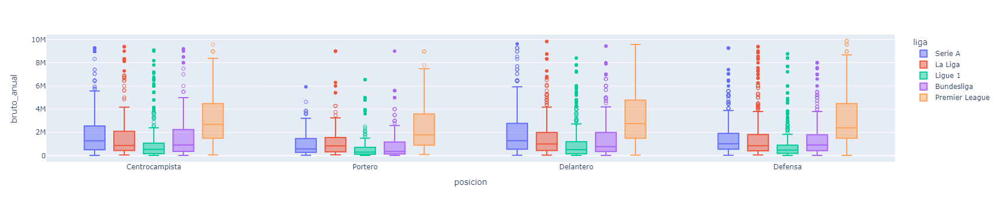

In [33]:
px.box(data_frame = sd[(sd["bruto_anual"] < 10000000)],
       x          = "posicion",
       y          = "bruto_anual",
       color      = "liga",
       points     = "suspectedoutliers",
       hover_name = "nombre_jugador",
       )

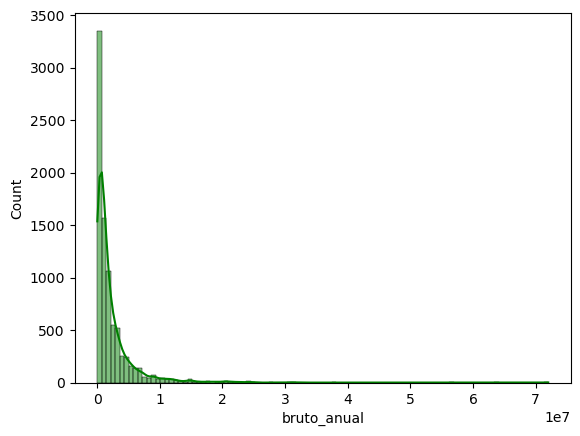

In [108]:
sns.histplot(sd["bruto_anual"], color = "green", bins = 100, kde=True)
plt.show()

In [112]:
sd[sd["nombre_jugador"] == "Erling Haaland"]

,temporada,liga,nombre_jugador,equipo,prestamo,es_titular,firma_contrato,vencimiento_contrato,posicion,edad,pais_jugador,bruto_anual,neto_anual,bono_bruto,bono_neto,total_bruto,total_neto,clausula_rescision,pais
2541,2023,Premier League,Erling Haaland,Manchester City,False,True,2022-07-01,2027-06-30,Delantero,23,Norway,22428506.0,12341429.0,28409441.0,15630943.0,89714024.0,49365717.0,198981105.0,England
2693,2022,Premier League,Erling Haaland,Manchester City,NaN,NaN,NaN,NaN,Delantero,22,Norway,22428506.0,12341429.0,NaN,NaN,NaN,NaN,NaN,England
6731,2021,Bundesliga,Erling Haaland,Borussia Dortmund,NaN,NaN,NaN,NaN,Delantero,21,Norway,7900000.0,4190000.0,NaN,NaN,NaN,NaN,NaN,Germany


In [47]:
sd["posicion"].unique()

array(['Centrocampista', 'Defensa', 'Delantero', 'Portero'], dtype=object)

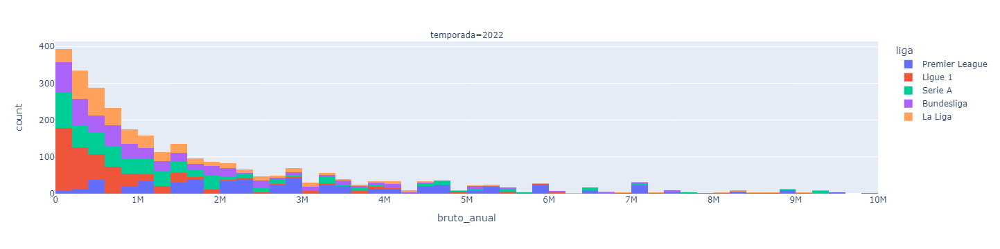

In [120]:
px.histogram(data_frame = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)], 
             x          = "bruto_anual",
             color      = "liga",
             facet_col  = "temporada",
             nbins      = 75)

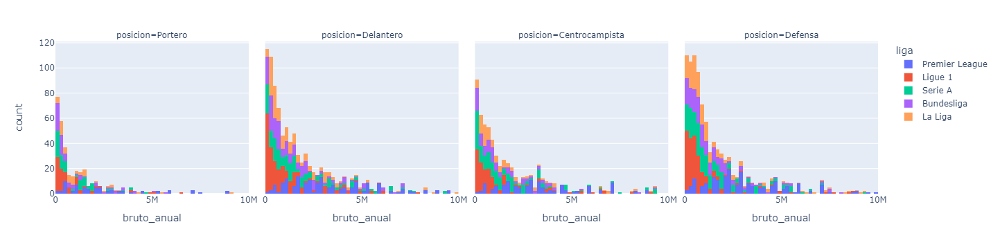

In [121]:
px.histogram(data_frame = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)], 
             x          = "bruto_anual",
             color      = "liga",
             facet_col  = "posicion",
             nbins      = 75)

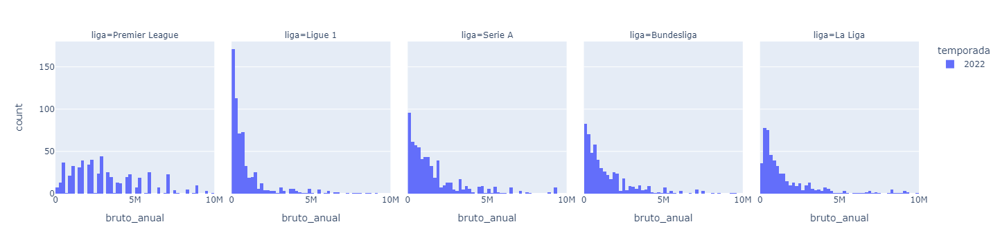

In [122]:
px.histogram(data_frame = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)], 
             x          = "bruto_anual",
             color      = "temporada",
             facet_col  = "liga",
             nbins      = 75)

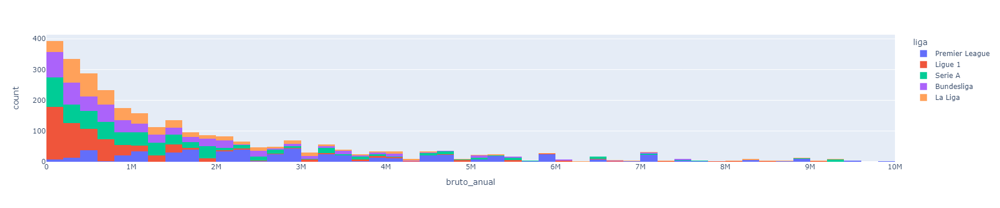

In [34]:
px.histogram(data_frame = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)],
             x          = "bruto_anual",
             hover_data = ["liga"],
             color      = "liga",
             nbins      = 75)

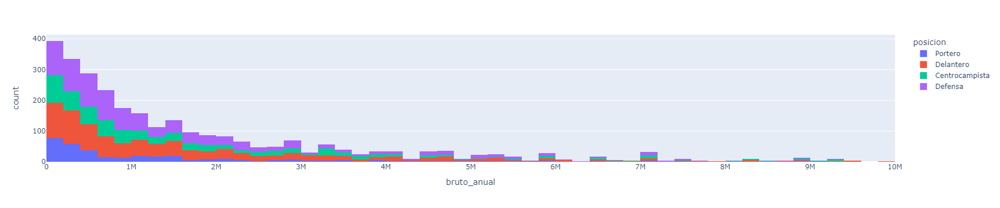

In [35]:
px.histogram(data_frame = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)],
             x          = "bruto_anual",
             hover_data = "liga",
             color      = "posicion",
             nbins      = 75)

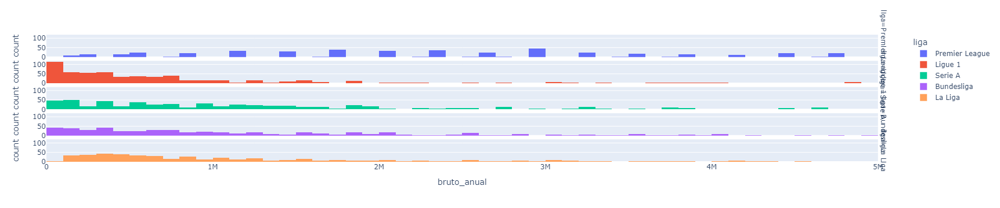

In [36]:
px.histogram(data_frame = sd[(sd["temporada"] == 2022) & (sd["bruto_anual"] < 5000000)],
             x          = "bruto_anual", 
             hover_data = "liga",
             color      = "liga",
             nbins      = 75,
             
             facet_row = "liga")

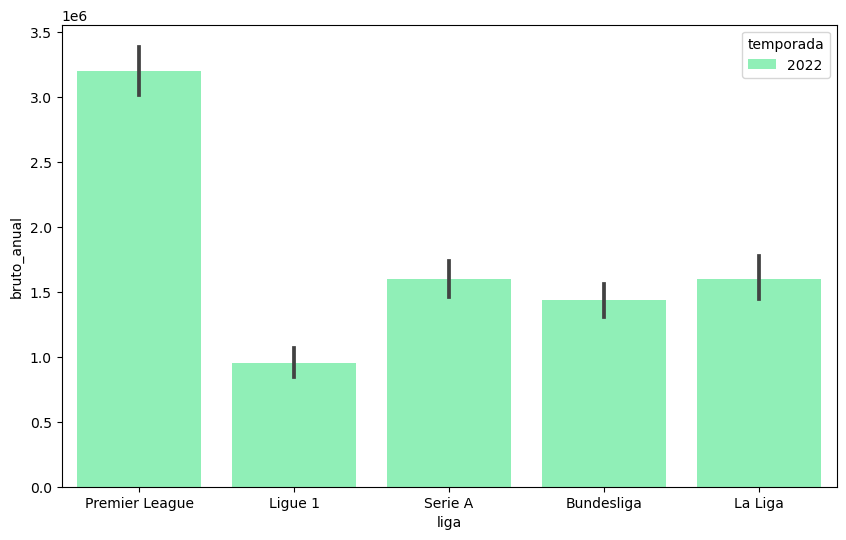

In [37]:
fig, ax = plt.subplots(figsize = (10, 6))

sns.barplot(x = "liga", y = "bruto_anual", hue = "temporada", palette = "rainbow", data = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)])
plt.show()

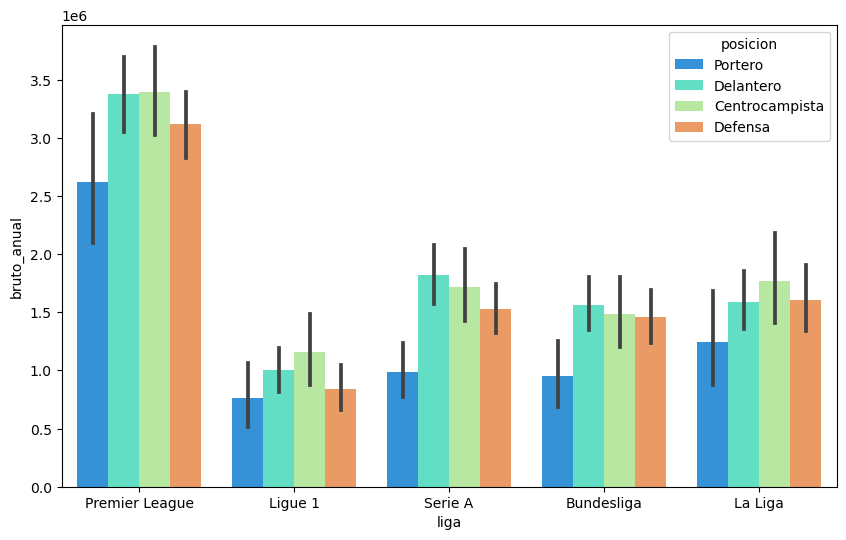

In [38]:
fig, ax = plt.subplots(figsize = (10, 6))

sns.barplot(x = "liga", y = "bruto_anual", hue = "posicion", palette = "rainbow", data = sd[(sd['temporada'] == 2022) & (sd["bruto_anual"] < 10000000)])
plt.show()

In [47]:
sd[(sd['temporada'] == 2023)].groupby(['liga']).total_neto.sum()

liga
Bundesliga        1.414550e+09
La Liga           1.558840e+09
Ligue 1           1.212320e+09
Premier League    3.751737e+09
Serie A           1.660959e+09
Name: total_neto, dtype: float64

In [39]:
sd.groupby(["liga"]).bruto_anual.sum()

liga
Bundesliga        2.950760e+09
La Liga           3.914250e+09
Ligue 1           2.437830e+09
Premier League    6.597241e+09
Serie A           3.345282e+09
Name: bruto_anual, dtype: float64

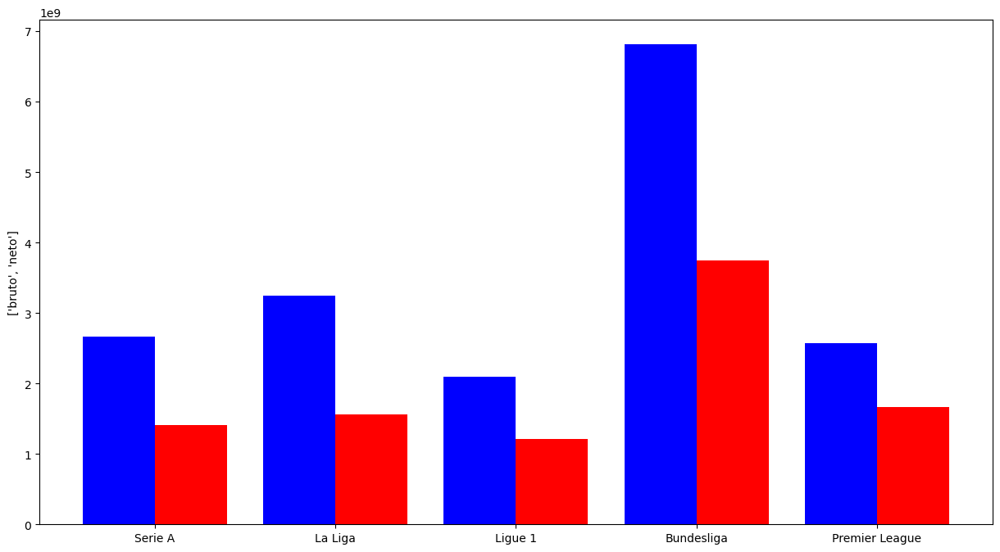

In [48]:
#bruto vs neto

fig, ax = plt.subplots(figsize = (15, 8))

etiquetas = sd["liga"].unique()
valores1 = sd[(sd['temporada'] == 2023)].groupby(['liga']).total_bruto.sum()
valores2 = sd[(sd['temporada'] == 2023)].groupby(['liga']).total_neto.sum()

x = np.arange(len(etiquetas))

ancho = 0.4

plt.bar(x - ancho/2, valores1, width = ancho, color = "blue")
plt.bar(x + ancho/2, valores2, width = ancho , color = "red")
ax.set_ylabel(ylabel = ["bruto", "neto"])

ax.set_xticks(x) # seteame el eje X tantas columnas como la longitud de x
ax.set_xticklabels(etiquetas) # con estos valores
plt.show()

In [49]:
df1 = pd.read_csv("limpios/datos_por_equipo_1.csv")
df1

,equipo,goles_a_favor,tiros_pp,tarjetas_amarillas,tarjetas_rojas,pc_posesion,pc_pases,aereos_a_favor,rating,liga,temporada
0,Bayern Munich,97,19.8,36,2,0.648,0.860,12.5,6.98,Bundesliga,2021
1,Bayer Leverkusen,80,13.5,64,2,0.537,0.818,13.1,6.77,Bundesliga,2021
2,Borussia Dortmund,85,13.3,61,1,0.594,0.840,12.5,6.77,Bundesliga,2021
3,RB Leipzig,72,12.9,49,0,0.565,0.831,14.9,6.77,Bundesliga,2021
4,Freiburg,58,13.6,34,0,0.486,0.762,19.9,6.68,Bundesliga,2021
...,...,...,...,...,...,...,...,...,...,...,...
287,Torino,7,9.4,20,0,0.497,0.811,14.5,6.44,Serie A,2023
288,Udinese,6,13.2,18,1,0.461,0.796,16.4,6.44,Serie A,2023
289,Cagliari,9,12.2,16,1,0.414,0.783,13.2,6.34,Serie A,2023
290,Empoli,3,10.9,25,0,0.442,0.786,9.3,6.33,Serie A,2023


In [50]:
df1["liga"].unique()

array(['Bundesliga', 'La Liga', 'Ligue 1', 'Premier League', 'Serie A'],
      dtype=object)

In [51]:
df2 = pd.read_csv("limpios/datos_por_equipo_2.csv")
df2

,equipo,victorias,empates,derrotas,goles_a_favor,goles_en_contra,puntos,pc_porteria_a_cero,pc_ambos_equipos_marcan,goles_esperados,goles_pp,temporada,liga
0,Bayern Munich,24,5,5,97,37,77,0.32,0.68,2.66,3.94,2021,Bundesliga
1,Borussia Dortmund,22,3,9,85,52,69,0.21,0.76,1.77,4.03,2021,Bundesliga
2,Bayer Leverkusen,19,7,8,80,47,64,0.24,0.68,1.75,3.74,2021,Bundesliga
3,RB Leipzig,17,7,10,72,37,58,0.29,0.59,1.75,3.21,2021,Bundesliga
4,Union Berlin,16,9,9,50,44,57,0.24,0.59,1.36,2.76,2021,Bundesliga
...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,Verona,2,2,6,6,12,8,0.30,0.40,0.90,1.80,2023,Serie A
288,Udinese,0,7,3,6,14,7,0.30,0.50,1.36,2.00,2023,Serie A
289,Empoli,2,1,6,3,16,7,0.33,0.00,1.06,2.11,2023,Serie A
290,Cagliari,1,3,6,9,21,6,0.20,0.50,1.12,3.00,2023,Serie A


In [52]:
df2["liga"].unique()

array(['Bundesliga', 'La Liga', 'Ligue 1', 'Premier League', 'Serie A'],
      dtype=object)

In [53]:
df3 = pd.merge(df1, df2, how = "inner", left_on = ["equipo", "goles_a_favor", "liga", "temporada"], right_on = ["equipo", "goles_a_favor", "liga", "temporada"])

In [54]:
df3.head()

,equipo,goles_a_favor,tiros_pp,tarjetas_amarillas,tarjetas_rojas,pc_posesion,pc_pases,aereos_a_favor,rating,liga,temporada,victorias,empates,derrotas,goles_en_contra,puntos,pc_porteria_a_cero,pc_ambos_equipos_marcan,goles_esperados,goles_pp
0,Bayern Munich,97,19.8,36,2,0.648,0.860,12.5,6.98,Bundesliga,2021,24,5,5,37,77,0.32,0.68,2.66,3.94
1,Bayer Leverkusen,80,13.5,64,2,0.537,0.818,13.1,6.77,Bundesliga,2021,19,7,8,47,64,0.24,0.68,1.75,3.74
2,Borussia Dortmund,85,13.3,61,1,0.594,0.840,12.5,6.77,Bundesliga,2021,22,3,9,52,69,0.21,0.76,1.77,4.03
3,RB Leipzig,72,12.9,49,0,0.565,0.831,14.9,6.77,Bundesliga,2021,17,7,10,37,58,0.29,0.59,1.75,3.21
4,Freiburg,58,13.6,34,0,0.486,0.762,19.9,6.68,Bundesliga,2021,15,10,9,46,55,0.29,0.65,1.64,3.06


In [55]:
sd_posicion = sd.groupby(["temporada", "liga", "equipo", "posicion"]).bruto_anual.sum().reset_index(name='count')

In [56]:
sd_posicion = pd.DataFrame(sd_posicion)
sd_posicion.columns = sd_posicion.columns.str.replace("count", "bruto_ppos")
sd_posicion

,temporada,liga,equipo,posicion,bruto_ppos
0,2021,Bundesliga,Arminia Bielefeld,Centrocampista,4870000.0
1,2021,Bundesliga,Arminia Bielefeld,Defensa,3040000.0
2,2021,Bundesliga,Arminia Bielefeld,Delantero,1830000.0
3,2021,Bundesliga,Arminia Bielefeld,Portero,890000.0
4,2021,Bundesliga,Augsburg,Centrocampista,5280000.0
...,...,...,...,...,...
1163,2023,Serie A,Udinese,Portero,2860000.0
1164,2023,Serie A,Verona,Centrocampista,5190000.0
1165,2023,Serie A,Verona,Defensa,6350000.0
1166,2023,Serie A,Verona,Delantero,10440000.0


In [57]:
sd_posicion.columns

Index(['temporada', 'liga', 'equipo', 'posicion', 'bruto_ppos'], dtype='object')

In [58]:
sd_bruto = sd.groupby(["temporada", "liga", "equipo"]).bruto_anual.sum().reset_index(name='count')
sd_bruto

,temporada,liga,equipo,count
0,2021,Bundesliga,Arminia Bielefeld,10630000.0
1,2021,Bundesliga,Augsburg,25410000.0
2,2021,Bundesliga,Bayer Leverkusen,56950000.0
3,2021,Bundesliga,Bayern Munich,236210000.0
4,2021,Bundesliga,Bochum,15770000.0
...,...,...,...,...
287,2023,Serie A,Salernitana,28590000.0
288,2023,Serie A,Sassuolo,33700000.0
289,2023,Serie A,Torino,38790000.0
290,2023,Serie A,Udinese,26240000.0


In [59]:
sd_bruto = pd.DataFrame(sd_bruto)

In [60]:
sd_bruto.columns = sd_bruto.columns.str.replace("count", "bruto_peq")
sd_bruto.head(2)

,temporada,liga,equipo,bruto_peq
0,2021,Bundesliga,Arminia Bielefeld,10630000.0
1,2021,Bundesliga,Augsburg,25410000.0


In [61]:
df3 = pd.merge(df3, sd_bruto, how = "inner", left_on = ["equipo", "liga", "temporada"], right_on = ["equipo","liga", "temporada"])

In [62]:
sd_bruto[sd_bruto["equipo"] == "Bayer Leverkusen"]

,temporada,liga,equipo,bruto_peq
2,2021,Bundesliga,Bayer Leverkusen,56950000.0
99,2022,Bundesliga,Bayer Leverkusen,60720000.0
197,2023,Bundesliga,Bayer Leverkusen,62370000.0


In [63]:
df3.head(3)

,equipo,goles_a_favor,tiros_pp,tarjetas_amarillas,tarjetas_rojas,pc_posesion,pc_pases,aereos_a_favor,rating,liga,...,victorias,empates,derrotas,goles_en_contra,puntos,pc_porteria_a_cero,pc_ambos_equipos_marcan,goles_esperados,goles_pp,bruto_peq
0,Bayern Munich,97,19.8,36,2,0.648,0.860,12.5,6.98,Bundesliga,...,24,5,5,37,77,0.32,0.68,2.66,3.94,236210000.0
1,Bayer Leverkusen,80,13.5,64,2,0.537,0.818,13.1,6.77,Bundesliga,...,19,7,8,47,64,0.24,0.68,1.75,3.74,56950000.0
2,Borussia Dortmund,85,13.3,61,1,0.594,0.840,12.5,6.77,Bundesliga,...,22,3,9,52,69,0.21,0.76,1.77,4.03,116450000.0


In [64]:
sd_posicion.columns

Index(['temporada', 'liga', 'equipo', 'posicion', 'bruto_ppos'], dtype='object')

In [65]:
df3 = pd.merge(df1, df2, how = "inner", left_on = ["equipo", "goles_a_favor", "liga", "temporada"], right_on = ["equipo", "goles_a_favor", "liga", "temporada"])

In [66]:
df3 = pd.merge(df3, sd_bruto, how = "inner", left_on = ["equipo", "liga", "temporada"], right_on = ["equipo","liga", "temporada"])

In [67]:
df3 = pd.merge(df3, sd_posicion, how = "inner", left_on = ["equipo", "liga", "temporada"], right_on = ["equipo","liga", "temporada"])

In [68]:
dfg = pd.read_csv("goleadores.csv")
dfg.head(2)

,PlayerName,TeamName,playedMatches,goals,assists,penalties,League
0,Sehrou Guirassy,VfB Stuttgart,8,14,2.0,1.0,Bundesliga
1,Harry Kane,FC Bayern München,9,12,5.0,3.0,Bundesliga


In [69]:
dfg['League'].unique()

array(['Bundesliga', 'Ligue 1', 'Primera Division', 'Premier League',
       'Serie A'], dtype=object)

In [70]:
dfg.columns = dfg.columns.str.replace("PlayerName", "nombre_jugador")
dfg.columns = dfg.columns.str.replace("League", "liga")
dfg.drop(['TeamName'], axis = 1, inplace = True)
dfg['liga'] = dfg["liga"].replace({"Primera Division" : "La Liga"})
dfg['temporada'] = 2023
dfg.head(2)

,nombre_jugador,playedMatches,goals,assists,penalties,liga,temporada
0,Sehrou Guirassy,8,14,2.0,1.0,Bundesliga,2023
1,Harry Kane,9,12,5.0,3.0,Bundesliga,2023


In [73]:
dfg = pd.merge(dfg, sd, how = "inner", left_on = ["nombre_jugador", "liga", "temporada"], right_on = ["nombre_jugador","liga", "temporada"])

In [75]:
dfg.columns

Index(['nombre_jugador', 'playedMatches', 'goals', 'assists', 'penalties',
       'liga', 'temporada', 'equipo', 'prestamo', 'es_titular',
       'firma_contrato', 'vencimiento_contrato', 'posicion', 'edad',
       'pais_jugador', 'bruto_anual', 'neto_anual', 'bono_bruto', 'bono_neto',
       'total_bruto', 'total_neto', 'clausula_rescision', 'pais'],
      dtype='object')

In [77]:
dfg = dfg.sort_values(['goals'], ascending = False).reset_index()
dfg

,index,nombre_jugador,playedMatches,goals,assists,penalties,liga,temporada,equipo,prestamo,...,edad,pais_jugador,bruto_anual,neto_anual,bono_bruto,bono_neto,total_bruto,total_neto,clausula_rescision,pais
0,0,Harry Kane,9,12,5.0,3.0,Bundesliga,2023,Bayern Munich,False,...,30,England,25000000.0,13250000.0,NaN,NaN,100000000.0,53000000.0,NaN,Germany
1,27,Erling Haaland,10,11,2.0,2.0,Premier League,2023,Manchester City,False,...,23,Norway,22428506.0,12341429.0,28409441.0,15630943.0,89714024.0,49365717.0,198981105.0,England
2,36,Lautaro Martínez,10,11,2.0,1.0,Serie A,2023,Inter,False,...,26,Argentina,11110000.0,6000000.0,NaN,NaN,33330000.0,18000000.0,NaN,Italy
3,18,Jude Bellingham,11,10,2.0,NaN,La Liga,2023,Real Madrid,False,...,20,England,20830000.0,10000000.0,4170000.0,2000000.0,124980000.0,60000000.0,NaN,Spain
4,9,Kylian Mbappé,9,10,1.0,3.0,Ligue 1,2023,PSG,False,...,24,France,72000000.0,39600000.0,60000000.0,33000000.0,72000000.0,39600000.0,NaN,France
5,2,Loïs Openda,9,8,2.0,NaN,Bundesliga,2023,Leipzig,False,...,23,Belgium,5660000.0,3000000.0,NaN,NaN,28300000.0,15000000.0,NaN,Germany
6,3,Jonas Wind,9,8,1.0,NaN,Bundesliga,2023,Wolfsburg,False,...,24,Denmark,2040000.0,1080000.0,NaN,NaN,6120000.0,3240000.0,NaN,Germany
7,1,Leroy Sané,9,8,2.0,NaN,Bundesliga,2023,Bayern Munich,False,...,27,Germany,20000000.0,10600000.0,NaN,NaN,40000000.0,21200000.0,NaN,Germany
8,28,Mohamed Salah,10,8,4.0,3.0,Premier League,2023,Liverpool,False,...,31,Egypt,20933272.0,11513300.0,2990467.0,1644757.0,41866545.0,23026600.0,NaN,England
9,29,Heung-min Son,10,8,1.0,NaN,Premier League,2023,Tottenham,False,...,31,South Korea,11363776.0,6245476.0,NaN,NaN,22727553.0,12490953.0,NaN,England


In [79]:
dfg['nombre_jugador'].head(10)

0          Harry Kane
1      Erling Haaland
2    Lautaro Martínez
3     Jude Bellingham
4       Kylian Mbappé
5         Loïs Openda
6          Jonas Wind
7          Leroy Sané
8       Mohamed Salah
9       Heung-min Son
Name: nombre_jugador, dtype: object

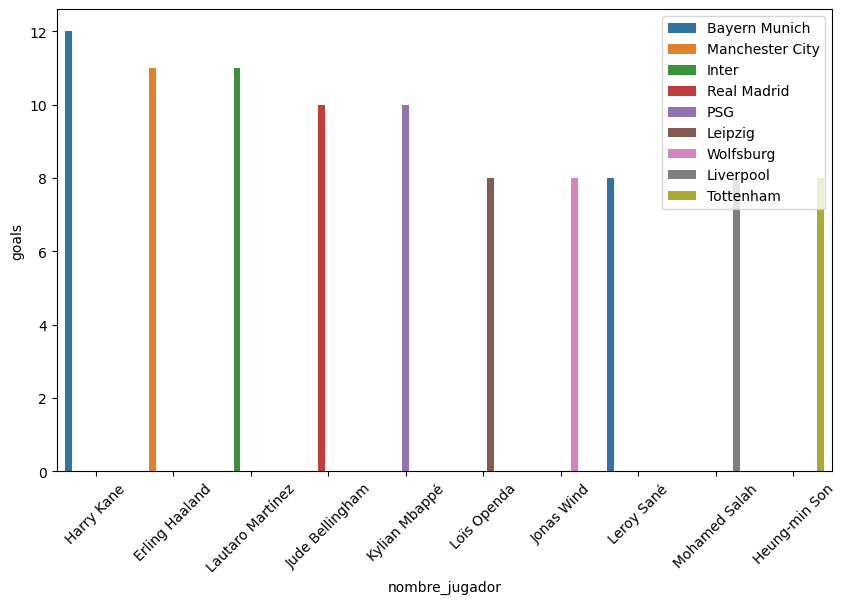

In [82]:
fig, ax = plt.subplots(figsize = (10, 6))

sns.barplot(x = "nombre_jugador", y = "goals", hue = "equipo", data = dfg.head(10))
ax.set_xticklabels(dfg['nombre_jugador'].head(10), rotation=45)
plt.legend(loc='upper right')
plt.show()

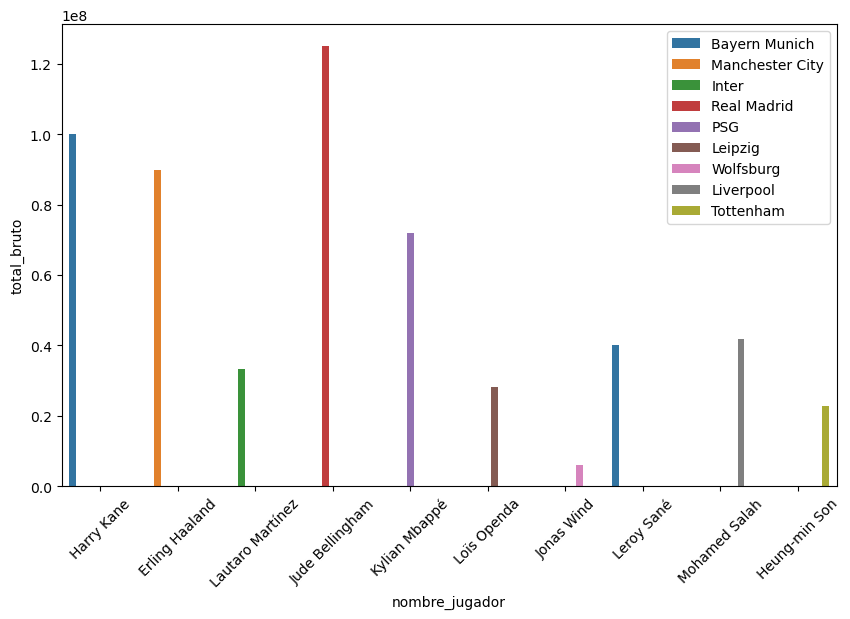

In [83]:
fig, ax = plt.subplots(figsize = (10, 6))

sns.barplot(x = "nombre_jugador", y = "total_bruto", hue = "equipo", data = dfg.head(10))
ax.set_xticklabels(dfg['nombre_jugador'].head(10), rotation=45)
plt.legend(loc='upper right')
plt.show()

In [264]:
df3.columns

Index(['equipo', 'goles_a_favor', 'tiros_pp', 'tarjetas_amarillas',
       'tarjetas_rojas', 'pc_posesion', 'pc_pases', 'aereos_a_favor', 'rating',
       'liga', 'temporada', 'victorias', 'empates', 'derrotas',
       'goles_en_contra', 'puntos', 'pc_porteria_a_cero',
       'pc_ambos_equipos_marcan', 'goles_esperados', 'goles_pp', 'bruto_peq',
       'posicion', 'bruto_ppos'],
      dtype='object')

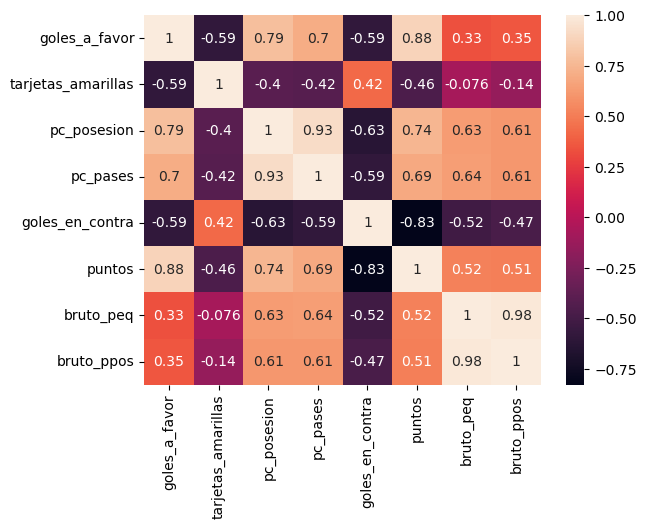

In [134]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["liga"] == "Premier League") & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

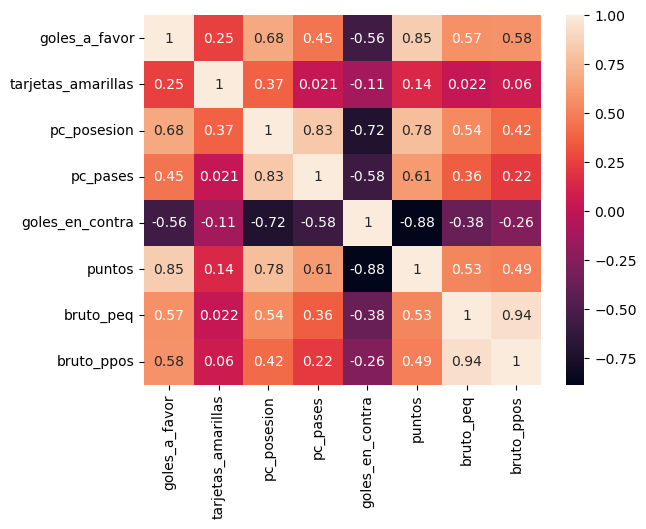

In [135]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["liga"] == "Ligue 1") & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

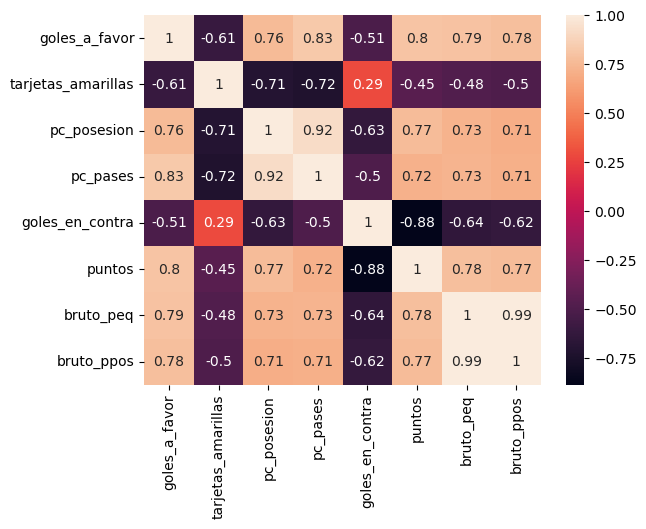

In [136]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["liga"] == "La Liga") & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

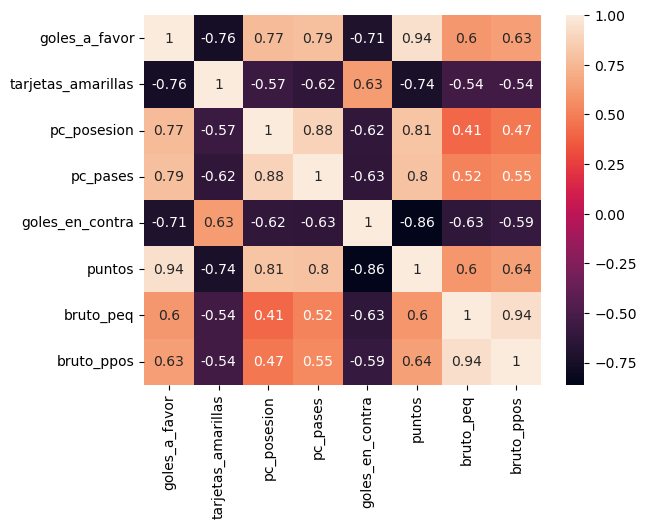

In [137]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["liga"] == "Serie A") & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

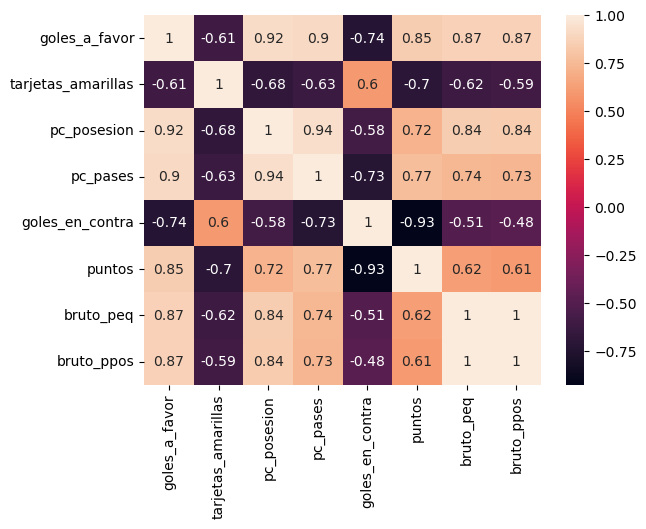

In [138]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["liga"] == "Bundesliga") & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

array(['Bundesliga', 'Ligue 1', 'Premier League', 'Serie A'], dtype=object)

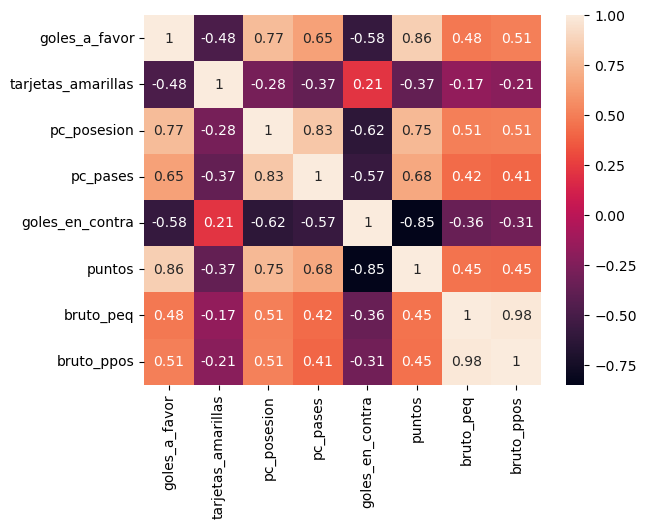

In [32]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2022) & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

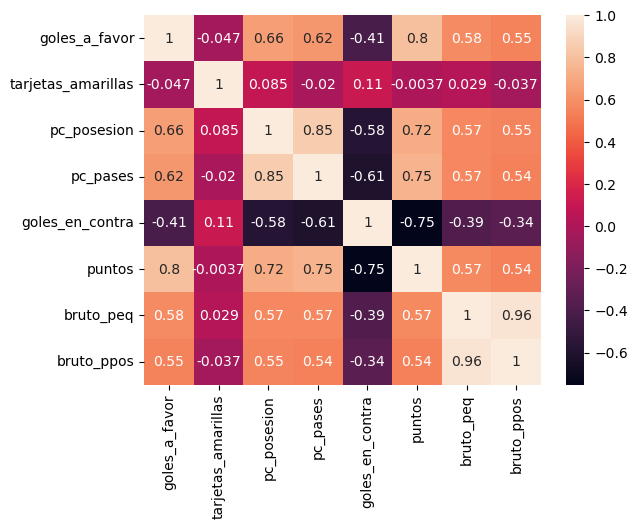

In [31]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2023) & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

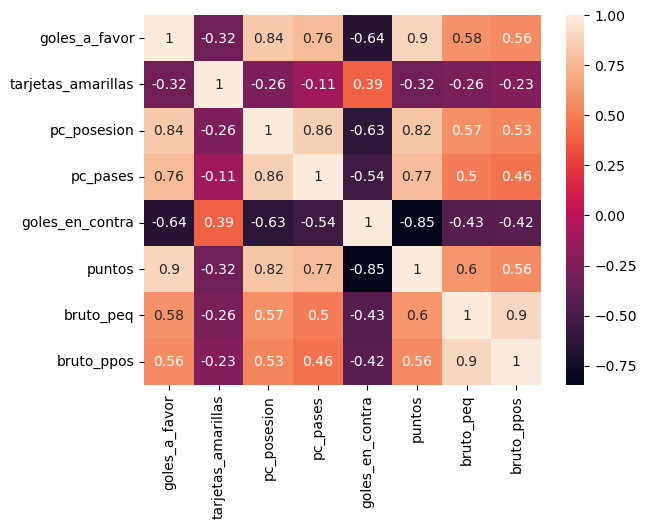

In [30]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2021) & (df3["posicion"] == "Centrocampista")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

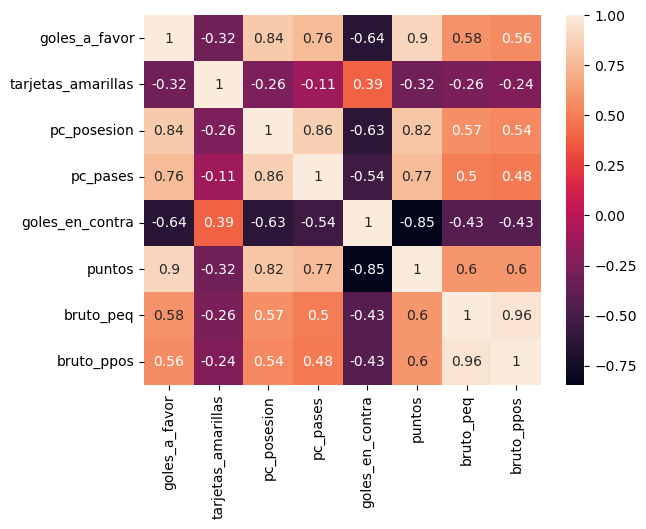

In [29]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2021) & (df3["posicion"] == "Defensa")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

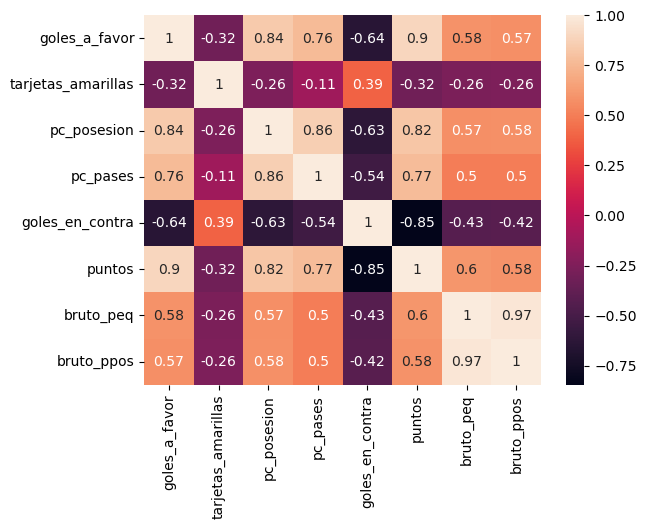

In [280]:
sns.heatmap(annot = True, data = df3[(df3["temporada"] == 2021) & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "goles_en_contra", "puntos",'bruto_peq','bruto_ppos']].corr())
plt.show()

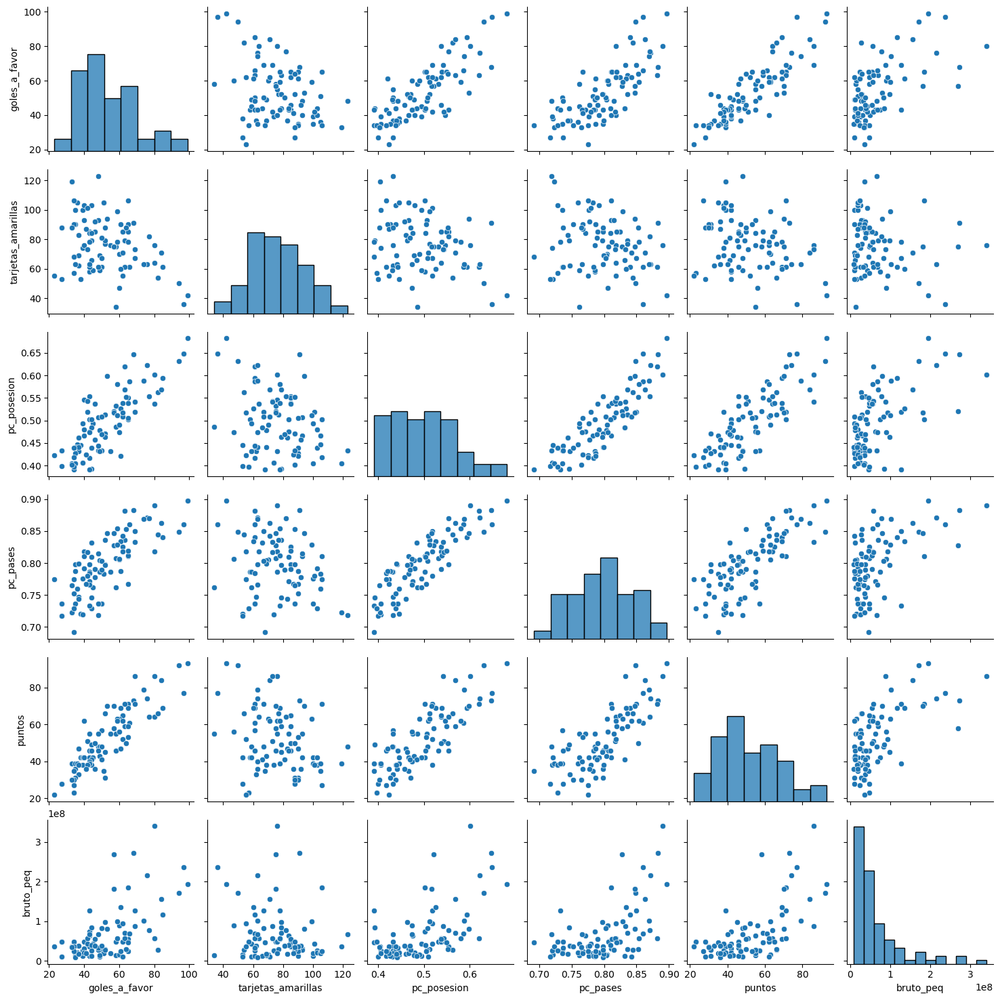

In [139]:
sns.pairplot(df3[(df3["temporada"] == 2021) & (df3["posicion"] == "Delantero")][["goles_a_favor", "tarjetas_amarillas", "pc_posesion", "pc_pases", "puntos",'bruto_peq']])
plt.show()

In [33]:
df3[(df3["temporada"] == 2021) & (df3["liga"] == "Premier League") & (df3["posicion"] == "Delantero")]

,equipo,goles_a_favor,tiros_pp,tarjetas_amarillas,tarjetas_rojas,pc_posesion,pc_pases,aereos_a_favor,rating,liga,...,derrotas,goles_en_contra,puntos,pc_porteria_a_cero,pc_ambos_equipos_marcan,goles_esperados,goles_pp,bruto_peq,posicion,bruto_ppos
118,Manchester City,99,18.8,42,1,0.682,0.897,12.7,7.11,Premier League,...,3,26,93,0.55,0.39,2.60,3.29,193888108.0,Delantero,86102460.0
122,Liverpool,94,19.2,50,1,0.631,0.849,15.1,7.05,Premier League,...,2,26,92,0.55,0.42,2.52,3.16,171114547.0,Delantero,46412055.0
126,Chelsea,76,15.6,63,1,0.622,0.871,14.3,6.92,Premier League,...,6,33,74,0.42,0.50,2.01,2.87,215474681.0,Delantero,83434042.0
130,Tottenham,69,12.9,67,1,0.519,0.850,14.9,6.88,Premier League,...,11,40,71,0.42,0.37,1.70,2.87,126998253.0,Delantero,49986813.0
134,West Ham,60,11.8,47,3,0.474,0.806,16.9,6.74,Premier League,...,14,51,56,0.21,0.63,1.56,2.92,89640411.0,Delantero,31100861.0
138,Crystal Palace,50,10.8,67,1,0.508,0.803,16.1,6.72,Premier League,...,12,46,48,0.32,0.50,1.27,2.53,82709425.0,Delantero,29904673.0
142,Arsenal,61,15.5,60,4,0.526,0.834,12.4,6.71,Premier League,...,13,48,69,0.34,0.42,1.92,2.87,135806325.0,Delantero,52160653.0
146,Manchester United,57,13.4,75,2,0.521,0.828,14.7,6.71,Premier League,...,12,57,58,0.21,0.58,1.74,3.00,268658995.0,Delantero,123736342.0
150,Brighton,42,12.9,73,2,0.543,0.817,15.1,6.70,Premier League,...,11,44,51,0.29,0.47,1.58,2.26,57301954.0,Delantero,19311518.0
154,Leicester,62,11.4,55,1,0.518,0.818,14.0,6.69,Premier League,...,14,59,52,0.18,0.68,1.46,3.18,93843167.0,Delantero,29260574.0
